# Propagations on Data Set

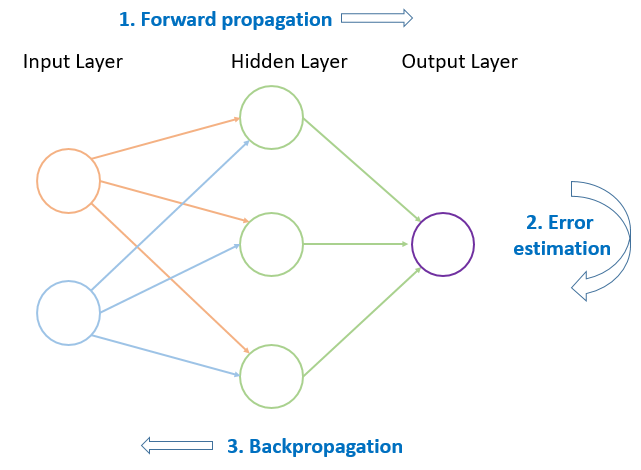

Let us now implement forward propagation and back propagation on a sample data set. Consider two independent variables, fuel consumption in litres (fuel) and distance travelled in kilometers (dist) along with a dependent variable budget in dollars (budget).

Sample data set:

> 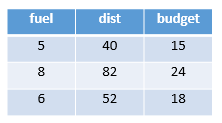

## Installing Packages

In [74]:
%pip install numpy matplotlib ipympl

Note: you may need to restart the kernel to use updated packages.


## Importing Libraries

In [75]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
%matplotlib inline

In [76]:
# X: (Feature 1, Feature 2)
X = np.array([[5, 40], 
              [8, 82], 
              [6, 52]], dtype=float)
# y: Target
y = np.array([[15], [24], [18]], dtype=float)
# Scaling units
X = X/np.max(X, axis=0) # maximum of X array
y = y/max(y) # maximum of y array

# Architecture of Neural Network

Next, let us define the architecture of the neural network to be built. We have one input layer assigned with two features with dimensions 3 x 2, hence two nodes. Then we have an output layer consisting of a quantitative output with dimensions 3 x 1, and hence we assign it with one node. Next, we take a hidden layer and assign it with three nodes. The overall model architecture resembles the diagram shown below.

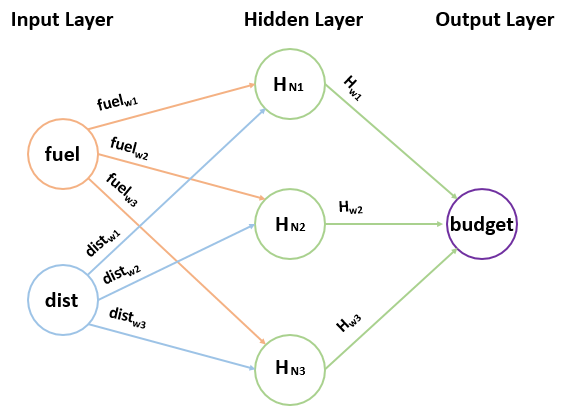

## Scaling values

In [77]:
fuel = 5/8
dist = 40/82
budget = 15/24

print(f"fuel = {fuel:.3f}")
print(f"dist = {dist:.3f}")
print(f"budget = {budget:.3f}")

fuel = 0.625
dist = 0.488
budget = 0.625


## Setting weights for fuel & dist nodes

In [78]:
fuelw1,  fuelw2, fuelw3 = 0.3, 0.2, 0.6

distw1, distw2, distw3 = 0.22, 0.4, 0.5

## Finding Values of Hidden Layer

In [79]:
HN1 = (fuel * 0.3) + (dist * 0.22)
HN2 = (fuel * 0.2) + (dist * 0.56)
HN3 = (fuel * 0.6) + (dist * 0.7)

print(f"Hidden layer node 1 (HN1): {HN1:.5f}")
print(f"Hidden layer node 2 (HN2): {HN2:.5f}")
print(f"Hidden layer node 3 (HN3): {HN3:.5f}")

Hidden layer node 1 (HN1): 0.29482
Hidden layer node 2 (HN2): 0.39817
Hidden layer node 3 (HN3): 0.71646


## Finding final hidden layer node values

In [80]:
def sigmoid(s):
    return 1/(1+np.exp(-s))

print("sigmoid(HN1)=", sigmoid(HN1))
print("sigmoid(HN2)=", sigmoid(HN2))
print("sigmoid(HN3)=", sigmoid(HN3))

sigmoid(HN1)= 0.5731750210686929
sigmoid(HN2)= 0.5982480795150504
sigmoid(HN3)= 0.6718277619831275


## Finding final value of output layer

In [81]:
# Weights between hidden and output layer
Hw1, Hw2, Hw3 = 0.21, 0.45, 0.85

output = HN1 * sigmoid(Hw1) + HN2 * sigmoid(Hw2) + HN3 * sigmoid(Hw3)
print(f"Output layer value: {output:.4f}")

Output layer value: 0.9079


## Creating NN class

We can observe that the predicted output with assumed weights is 0.9079 whereas the actual output is 0.625. The difference between the predicted and actual output is 0.2829. However, this may or may not be the best prediction. This is where backpropagation comes handy which keeps on adjusting the loss to find optimum parameters.

As our aim is to decrease the loss (ideally to zero), and therefore we need to find the rate of change of the loss with respect to the weights which will help us to figure out the direction to alter the weights.

This process uses gradient descent which helps us to decrease the loss. We are going to learn more about gradient descent in the next section.

To find the change in the weights we first find the error margin of the output layer by taking the difference of predicted and actual output. Next, you need to apply the derivative of the sigmoid activation function to the output layer to figure out how much hidden layer contributed to the output error. 

In [82]:
class Neural_Network(object):
    def __init__(self):
        # Parameters
        self.inputSize = 2 # Two nodes
        self.outputSize = 1 # Single node
        self.hiddenSize = 3 # Three nodes

        # Weights
        self.W1 = np.random.randn(self.inputSize, self.hiddenSize) # (3x2) weight matrix from input to hidden layer
        self.W2 = np.random.randn(self.hiddenSize, self.outputSize) # (3x1) weight matrix from hidden to output layer

    def forward(self, X):
        #forward propagation through our network
        self.z = np.dot(X, self.W1) # dot product of X (input) and first set of 3x2 weights
        self.z2 = self.sigmoid(self.z) # activation function
        self.z3 = np.dot(self.z2, self.W2) # dot product of hidden layer (z2) and second set of 3x1 weights
        o = self.sigmoid(self.z3) # final activation function
        return o 

    def sigmoid(self, s):
        # activation function 
        return 1/(1+np.exp(-s))

    def sigmoidPrime(self, s):
        #derivative of sigmoid
        return s * (1 - s)

    def backward(self, X, y, o):
        # backward propgate through the network
        self.o_error = y - o # error in output
        self.o_delta = self.o_error*self.sigmoidPrime(o) # applying derivative of sigmoid to error

        self.z2_error = self.o_delta.dot(self.W2.T) # z2 error: how much our hidden layer weights contributed to output error
        self.z2_delta = self.z2_error*self.sigmoidPrime(self.z2) # applying derivative of sigmoid to z2 error

        self.W1 += X.T.dot(self.z2_delta) # adjusting first set (input --> hidden) weights
        self.W2 += self.z2.T.dot(self.o_delta) # adjusting second set (hidden --> output) weights

    def train (self, X, y):
        o = self.forward(X)
        self.backward(X, y, o)

NN = Neural_Network()

loss = []
epochs = 400
for i in range(epochs): # trains the NN equal to epochs
    loss.append(np.mean(np.square(y - NN.forward(X))))
    NN.train(X, y)

## Visualizing the loss in real-time

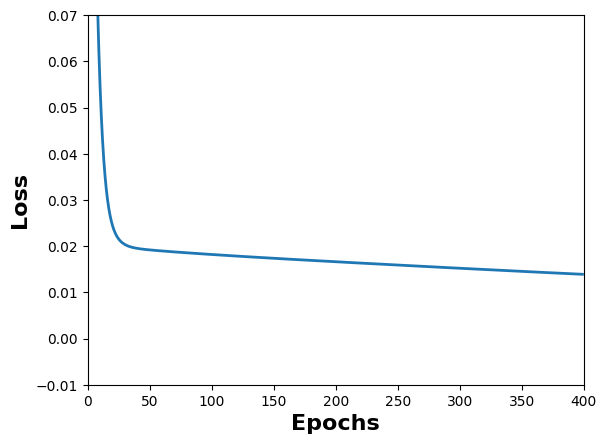

In [87]:
fig, ax = plt.subplots()
ax.set_xlim(0, len(loss))
ax.set_ylim(- 0.01, 0.07)
ax.set_xlabel('Epochs', weight='bold', fontsize=16)
ax.set_ylabel('Loss', weight='bold', fontsize=16)
line, = ax.plot([], [], lw=2)

def animate(i):
    line.set_data(np.arange(i), loss[:i])
    return line,

ani = animation.FuncAnimation(fig, animate, frames=len(loss)+1, interval=50, blit=True)

HTML(ani.to_jshtml())